In [1]:
using Revise

using FileIO
using Unitful: s
using SampleArrays
using PortAudioBindings

PortAudio library must be in the search path use something similar (if needed): `export LD_LIBRARY_PATH=/usr/local/lib:$LD_LIBRARY_PATH`

There are direct bindings to the PortAudio functions (prefixed by `Pa_`):

In [9]:
Pa_Terminate()

0

In [2]:
function print_devices()
    err = Pa_Initialize()
    println(unsafe_string(unsafe_load(Pa_GetVersionInfo()).versionText))
    numDevices = Pa_GetDeviceCount()
    @show numDevices
    for i in 0:numDevices-1
        deviceInfo = unsafe_load(Pa_GetDeviceInfo(i))
        deviceName = unsafe_string(deviceInfo.name)
        println("device $i: $deviceName $(deviceInfo.maxInputChannels)/$(deviceInfo.maxOutputChannels)")
#         @show deviceInfo
    end
    @show Pa_GetDefaultInputDevice()
    @show Pa_GetDefaultOutputDevice()
    err = Pa_Terminate()
end

print_devices()

PortAudio V19.6.0-devel, revision 396fe4b6699ae929d3a685b3ef8a7e97396139a4
numDevices = 16
device 0: HDA ATI SB: VT1708S Analog (hw:0,0) 0/8
device 1: Xonar U7 MKII: USB Audio #1 (hw:1,1) 0/2
device 2: Xonar U7 MKII: USB Audio #2 (hw:1,2) 0/2
device 3: HDA NVidia: HDMI 0 (hw:2,3) 0/8
device 4: HDA NVidia: HDMI 2 (hw:2,8) 0/8
device 5: sysdefault 0/128
device 6: front 0/8
device 7: surround21 0/128
device 8: surround40 0/8
device 9: surround41 0/128
device 10: surround50 0/128
device 11: surround51 0/8
device 12: surround71 0/8
device 13: pulse 32/32
device 14: dmix 0/2
device 15: default 32/32
Pa_GetDefaultInputDevice() = 15
Pa_GetDefaultOutputDevice() = 15


ALSA lib pcm_dsnoop.c:618:(snd_pcm_dsnoop_open) unable to open slave
ALSA lib pcm.c:2495:(snd_pcm_open_noupdate) Unknown PCM cards.pcm.rear
ALSA lib pcm.c:2495:(snd_pcm_open_noupdate) Unknown PCM cards.pcm.center_lfe
ALSA lib pcm.c:2495:(snd_pcm_open_noupdate) Unknown PCM cards.pcm.side
Cannot connect to server socket err = No such file or directory
Cannot connect to server request channel
jack server is not running or cannot be started
JackShmReadWritePtr::~JackShmReadWritePtr - Init not done for -1, skipping unlock
JackShmReadWritePtr::~JackShmReadWritePtr - Init not done for -1, skipping unlock


0

And there are several high-level functions for getting information, playback and recording. **Most of these methods need better error checking to be implemented**

In [9]:
pa = PortAudio()

ALSA lib pcm_dsnoop.c:618:(snd_pcm_dsnoop_open) unable to open slave
ALSA lib pcm.c:2495:(snd_pcm_open_noupdate) Unknown PCM cards.pcm.rear
ALSA lib pcm.c:2495:(snd_pcm_open_noupdate) Unknown PCM cards.pcm.center_lfe
ALSA lib pcm.c:2495:(snd_pcm_open_noupdate) Unknown PCM cards.pcm.side
Cannot connect to server socket err = No such file or directory
Cannot connect to server request channel
jack server is not running or cannot be started
JackShmReadWritePtr::~JackShmReadWritePtr - Init not done for -1, skipping unlock
JackShmReadWritePtr::~JackShmReadWritePtr - Init not done for -1, skipping unlock


PortAudio()

In [10]:
listdevices(pa)

16-element Array{NamedTuple,1}:
 (name = "HDA ATI SB: VT1708S Analog (hw:0,0)", nins = 0, nouts = 8, rate = 44100.0 Hz, inlowlatency = -1.0 s, outlowlatency = 0.005804988662131519 s, inhighlatency = -1.0 s, outhighlatency = 0.034829931972789115 s, defaultin = false, defaultout = false)
 (name = "Xonar U7 MKII: USB Audio #1 (hw:1,1)", nins = 0, nouts = 2, rate = 44100.0 Hz, inlowlatency = -1.0 s, outlowlatency = 0.008684807256235827 s, inhighlatency = -1.0 s, outhighlatency = 0.034829931972789115 s, defaultin = false, defaultout = false)
 (name = "Xonar U7 MKII: USB Audio #2 (hw:1,2)", nins = 0, nouts = 2, rate = 44100.0 Hz, inlowlatency = -1.0 s, outlowlatency = 0.008684807256235827 s, inhighlatency = -1.0 s, outhighlatency = 0.034829931972789115 s, defaultin = false, defaultout = false)
 (name = "HDA NVidia: HDMI 0 (hw:2,3)", nins = 0, nouts = 8, rate = 44100.0 Hz, inlowlatency = -1.0 s, outlowlatency = 0.005804988662131519 s, inhighlatency = -1.0 s, outhighlatency = 0.034829931972789

In [11]:
device_id_default_in(pa)

15

In [12]:
device_id_default_out(pa)

15

In [13]:
device_id_by_name(pa, "default")

15

In [43]:
d, rate = load("../data/test_sweep_fp.wav")[1:2]
d = SampleArray(Float32.(hcat(d, d)), rate)
# d = SampleArray(Float32.(d), 48000.0)

SampleArray{Float32}: 2 channels, 176400 frames ≈ 4.0 s, step ≈ 2.2675736961451248e-5 s sampled at 44100.0 Hz:
Float32[0.0 0.0; 0.0 0.0; … ; 0.0 0.0; 0.0 0.0]

In [44]:
play(pa, d; outdev=15, bsize=1024)

0

In [24]:
d2 = record(pa; s=3.0, nins=2)

SampleArray{Float32}: 2 channels, 132608 frames ≈ 3.006984126984127 s, step ≈ 2.2675736961451248e-5 s sampled at 44100.0 Hz:
Float32[1.50203705f-5 2.2649765f-5; -0.0004490614 2.2530556f-5; … ; -0.00036549568 0.00010454655; -0.00022339821 0.000101327896]

In [35]:
d2.data[:,:] |> maximum

0.010843992f0

In [66]:
@async play(pa, d; outdev=15)
d2 = record(pa; indev=15, s=10.0, nins=2)

SampleArray{Float32}: 2 channels, 441344 frames ≈ 10.00780045351474 s, step ≈ 2.2675736961451248e-5 s sampled at 44100.0 Hz:
Float32[-0.0004917383 -3.0994415f-6; -0.000541687 -4.7683716f-7; … ; 6.818771f-5 7.6293945f-6; 0.00016570091 -3.0875206f-5]

In [67]:
d2 = d2.result

LoadError: type SampleArray has no field result

In [ ]:
plot(d2.data[:, 2])

In [56]:
play(pa, 100d2[:, 2:2])

0

In [86]:
d3 = recordresponse(pa, d; indev=15, outdev=15, nins=2, post=1.0s, bsize=256)

ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun occurred
ALSA lib pcm.c:8306:(snd_pcm_recover) underrun o

SampleArray{Float32}: 2 channels, 220500 frames ≈ 5.0 s, step ≈ 2.2675736961451248e-5 s sampled at 44100.0 Hz:
Float32[4.4465065f-5 -2.670288f-5; -2.2530556f-5 4.0769577f-5; … ; -3.9935112f-5 3.1352043f-5; 4.2796135f-5 -4.1127205f-5]

In [ ]:
d3

In [14]:
play(pa, d3)

0

In [ ]:
d3.data

In [3]:
using Plots

In [2]:
w1 = readwav("../data/new-track.wav")
w2 = readwav("../data/new-track2.wav")
w3 = readwav("../data/new-track3.wav")
w4 = readwav("../data/new-track4.wav")

SampleArray{Float64}: 2 channels, 214016 frames ≈ 4.85297052154195 s, step ≈ 2.2675736961451248e-5 s sampled at 44100.0 Hz:
[0.0003967406231879635 0.0; 0.0004272591326639607 0.0; … ; 6.103701895199438e-5 0.0; 0.00024414807580797754 0.0]

In [59]:
w1.data[:, 1]

212736-element Array{Float64,1}:
  3.051850947599719e-5
  3.051850947599719e-5
 -3.051850947599719e-5
 -6.103701895199438e-5
  3.051850947599719e-5
  0.0
 -6.103701895199438e-5
 -3.051850947599719e-5
  0.0
 -6.103701895199438e-5
  0.0
  3.051850947599719e-5
 -6.103701895199438e-5
  ⋮
  0.0
 -3.051850947599719e-5
 -6.103701895199438e-5
  3.051850947599719e-5
 -3.051850947599719e-5
 -6.103701895199438e-5
 -3.051850947599719e-5
  3.051850947599719e-5
 -3.051850947599719e-5
 -3.051850947599719e-5
  3.051850947599719e-5
 -3.051850947599719e-5

In [7]:
plot(w1.data[:, 1])
plot!(100w1.data[:, 2])

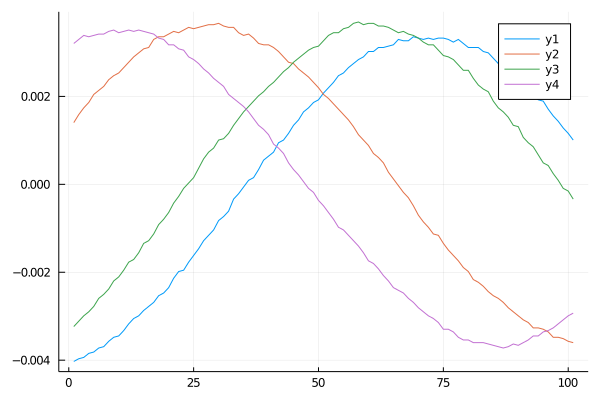

In [65]:
r = 155000:155100
c = 2
plot(w1.data[r, c])
plot!(w2.data[r, c])
plot!(w3.data[r, c])
plot!(w4.data[r, c])

In [68]:
100/44100

0.0022675736961451248

In [15]:
plot(w1.data[:, 2] .- w2.data[:, 2])